In [4]:
import json, scipy
from scipy.interpolate import griddata
from scipy.spatial import Delaunay
from skimage.draw import polygon
import matplotlib.pyplot as plt
import numpy as np
import cv2
import imageio
from PIL import Image
import os
import glob

plt.rcParams['figure.figsize'] = (8.0, 8.0)


def normalized_image(final):
    return (final-final.min())/(final.max()-final.min())


(14, 2)


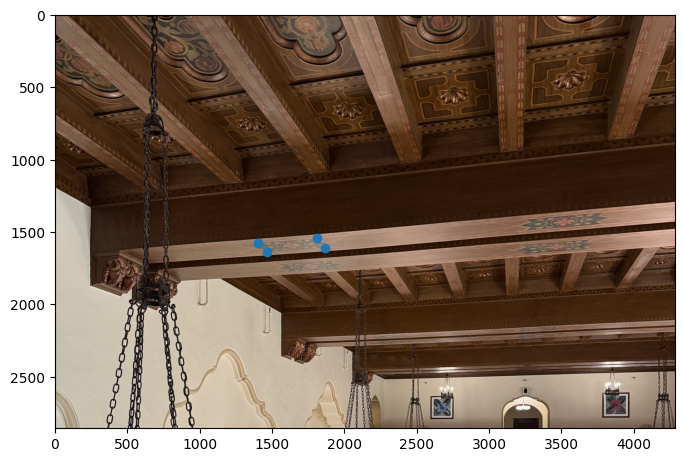

In [5]:
hall1 = plt.imread('data_big/hall1.jpeg')
hall2 = plt.imread('data_big/hall2.jpeg')
# (height, width, channels)
# Reading our correspondence points
with open('data/hall1_hall2.json', 'r') as file:
    points = json.load(file)
# Using *4 because I initially worked with downsampled images
# Okay im back to using the low res images because my laptop is slow
points_hall1 = np.array(points["im1Points"], dtype=np.float32) *4
points_hall2 = np.array(points["im2Points"], dtype=np.float32) *4
# Displaying the images and the points
plt.plot(points_hall1[:, 0][:4], points_hall1[:, 1][:4], 'o')
plt.imshow(hall1[:hall1.shape[0]//2, :, :])
plt.savefig('output/rec1_or.jpg', bbox_inches='tight')
print(points_hall1.shape)

In [6]:
# Calculating the homography matrix
def computeH(p1s, p2s):
    A = None
    b = None
    if len(p1s) != len(p2s):
        raise IndexError("points not the same length")
    for p1, p2 in zip(p1s,p2s):
        u1 = p1[0]
        v1 = p1[1]
        u2 = p2[0]
        v2 = p2[1]
        # stackig the points using the formula on my website
        aaa = np.array([[u1, v1, 1, 0, 0, 0, -u1*u2, -v1*u2], [0, 0, 0, u1, v1, 1, -u1*v2, -v1*v2]])
        bbb = np.array([[u2],[v2]])
        if A is None:
            A = aaa
        else:
            A = np.vstack((aaa, A))
        if b is None:
            b = bbb
        else:
            b = np.vstack((bbb, b))
        # using least squares to find the best solution for our points
        h_vec = np.linalg.lstsq(A,b, rcond=None)[0]
    # Reshape to get the homography matrix
    h_vec = np.vstack((h_vec, [1]))
    return(h_vec.reshape(3, 3))

In [7]:
def warp_point(pt, H):
    # input : points_to_transform2 = np.float32([[30, 30], [70, 30], [70, 70]])
    # Input an inversed H for the inverse warp
    # eg warp_point(transformed_points, np.linalg.inv(homography_matrix))
    pt = np.hstack((pt.reshape(-1, 2), np.ones(pt.shape[0]).reshape(-1, 1)))
    warped = H@pt.T
    # We get a 3xn with values [x, y, 1].T
    warped /= warped[2, :]
    # return first row x and second row y, colum are the points
    return warped[:2]


(3, 3)


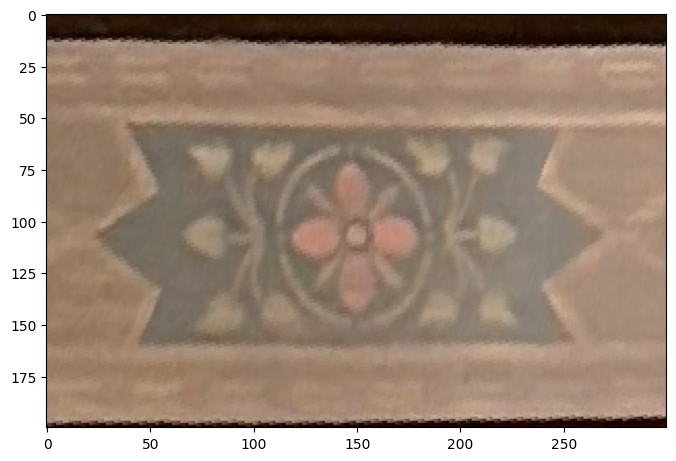

In [8]:
def warpit(im, H, size):
    # First make an empty image of target size
    # result = np.full((size[1], size[0], 3), 255)
    # We also add a alpha parameter
    result = np.zeros((size[1], size[0], 4), dtype=np.uint8)
    # Loop over all pixels in destination image
    for i in range(size[1]):  # y height
        for j in range(size[0]):  # x width
            # Inverse homography to tell us which pixel in the source image we should use
            xy1 = np.linalg.inv(H)@np.array([j, i, 1])
            xy1 /= xy1[2]
            x = int(xy1[0])
            y = int(xy1[1])

            # Only use pixels inside the bounds of the image
            if 0 <= x < im.shape[1] and 0 <= y < im.shape[0]:
                # NN interpolation
                # result[i, j] = im[int(y), int(x)]
                result[i, j] = np.append(im[int(y), int(x)], 255)
    return result

points_square = np.float32([[0, 0], [200, 0], [0, 100], [200, 100]]) + 50
homography = computeH(points_hall1[:4], points_square)
newimage = warpit(hall1, homography, (300, 200))
print(homography.shape)
plt.imshow(newimage)
plt.imsave('output/rec1_rec.jpg', newimage)





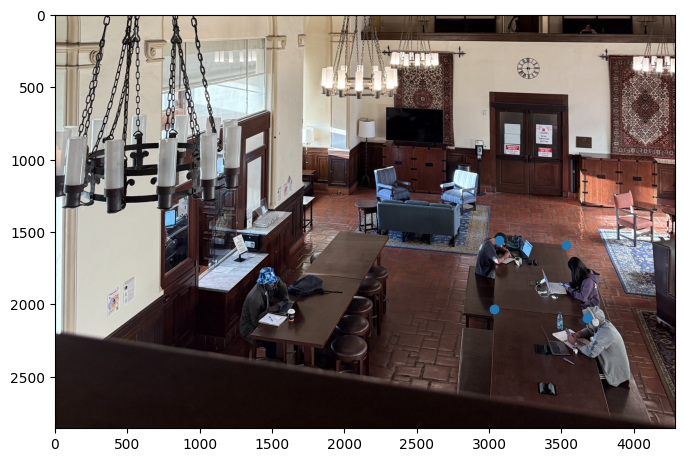

In [9]:
# Showing our original image
plt.plot(points_hall1[:, 0][-4:], points_hall1[:, 1][-4:] - hall1.shape[0]//2, 'o')
plt.imshow(hall1[hall1.shape[0]//2:, :, :])
plt.savefig('output/rec2_or.jpg', bbox_inches='tight') 



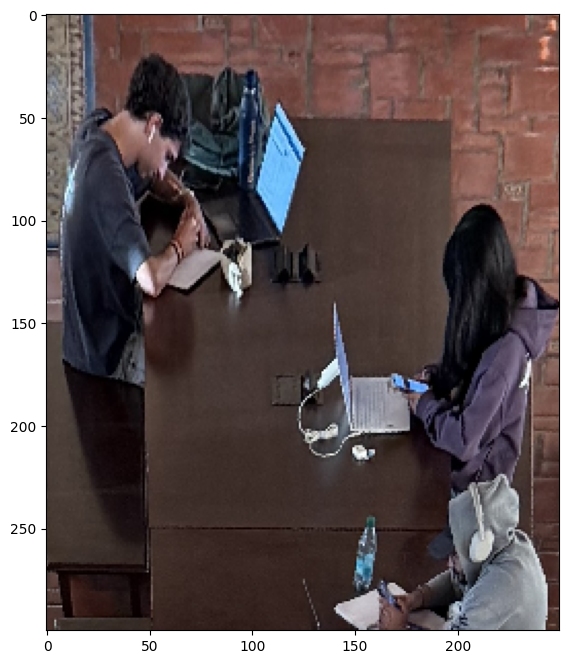

In [10]:
# Showing our warped image
points_square = np.float32([[0, 200], [0, 0], [150, 0], [150, 200]]) + 50
homography = computeH(points_hall1[-4:], points_square)
newimage = warpit(hall1, homography, (250, 300))

plt.imshow(newimage)
plt.imsave('output/rec2_rec.jpg', newimage)


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..2.0].


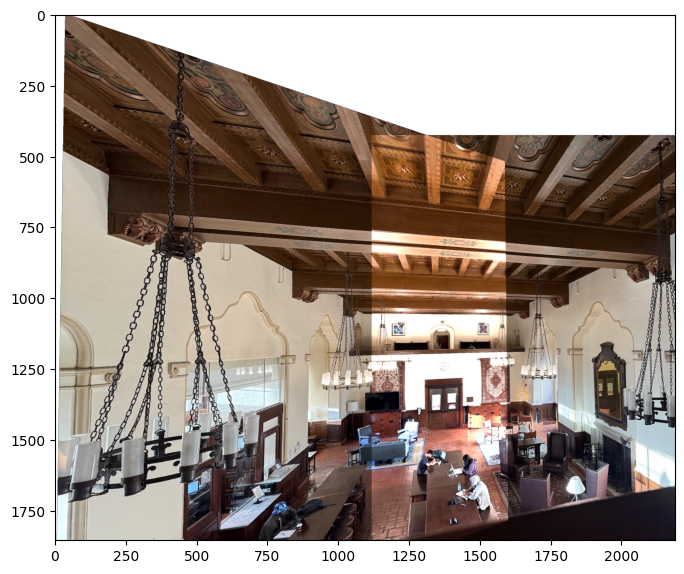

In [11]:
def getpoints(filename):
    # Here we just load our points gain
    with open(filename, 'r') as file:
        points = json.load(file)
    # Using *4 because I initially worked with downsampled images
    points_hall11 = np.array(points["im1Points"], dtype=np.float32)
    points_hall22 = np.array(points["im2Points"], dtype=np.float32)
    return points_hall11, points_hall22

def get_warped_image(hall1, hall2, homography):
    # These are the original corners of the input image warped with the momography into the destination image, so we know
    # How big our final image should be
    corners = warp_point(np.float32([[0, 0], [hall2.shape[1], 0], [0, hall2.shape[0]],[hall2.shape[1], hall2.shape[0]]]), homography)

    min_width = np.min(corners[0, :])
    min_height = np.min(corners[1, :])
    max_width = np.max(corners[0, :])
    max_height = np.max(corners[1, :])
    new_width = int(max_width - min_width)
    new_height = int(max_height - min_height)

    # Shifting our pixels so that ever pixel location is poisitive
    translation_matrix = np.array([[1, 0, -min_width],
                                [0, 1, -min_height],
                                [0, 0, 1]])

    shifted_homography = translation_matrix @ homography
    # Getting our final warped images
    warped_hall1 = warpit(hall1, shifted_homography, (int(hall2.shape[1]-min(min_width, 0)), int(hall2.shape[0]-min(min_height, 0))))
    warped_hall2 = warpit(hall2, translation_matrix, (int(hall2.shape[1]-min(min_width, 0)), int(hall2.shape[0]-min(min_height, 0))))
    # put pixels into range of 0-1
    warped_hall1 = warped_hall1 / 255.0
    warped_hall2 = warped_hall2 / 255.0
    return warped_hall1, warped_hall2

hall1 = plt.imread('data/hall1.jpeg')
hall2 = plt.imread('data/hall2.jpeg')
points_hall11, points_hall22 = getpoints("data/hallpoints4.json")
homography = computeH(points_hall11, points_hall22)
warped_hall1, warped_hall2 = get_warped_image(hall1, hall2, homography)
plt.imshow(warped_hall1 + warped_hall2)

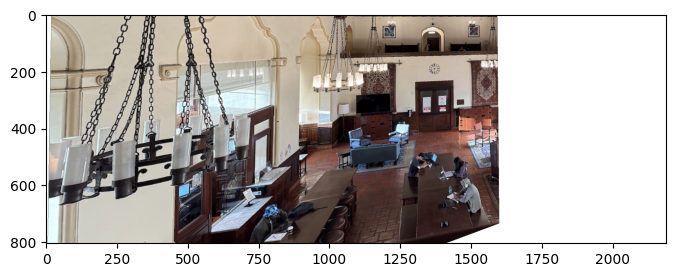

In [12]:
plt.imshow(warped_hall1[1050:]) 

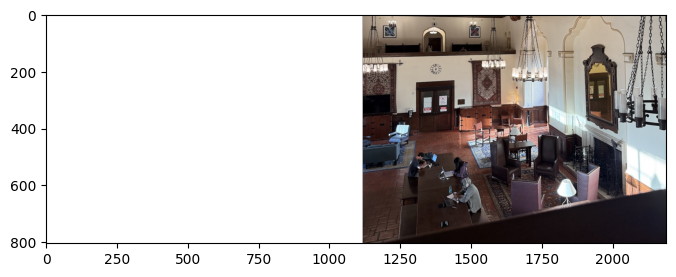

In [13]:
plt.imshow(warped_hall2[1050:])
plt.imsave('output/mosaic1_l.jpg', warped_hall1[1050:])
plt.imsave('output/mosaic1_r.jpg', warped_hall2[1050:])


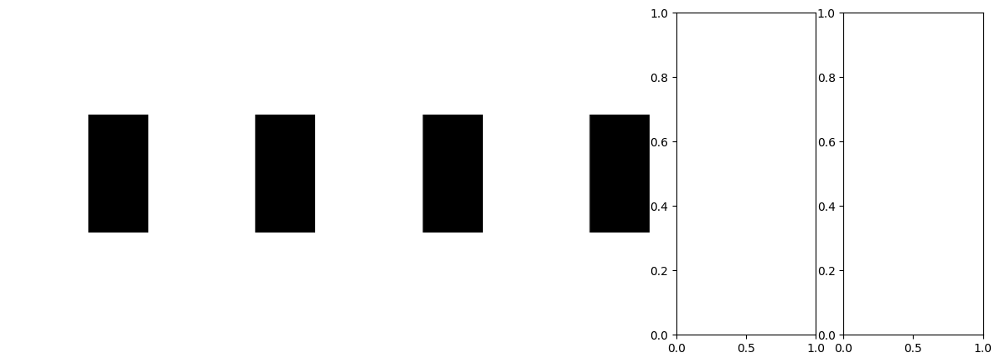

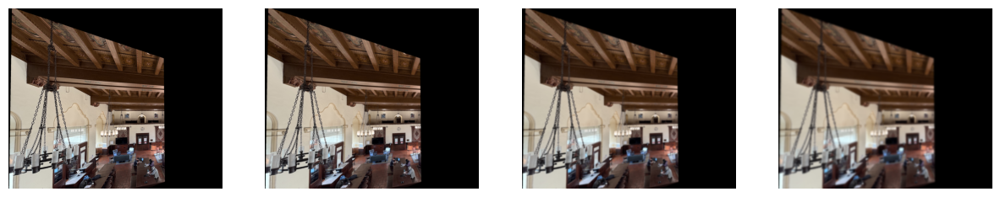

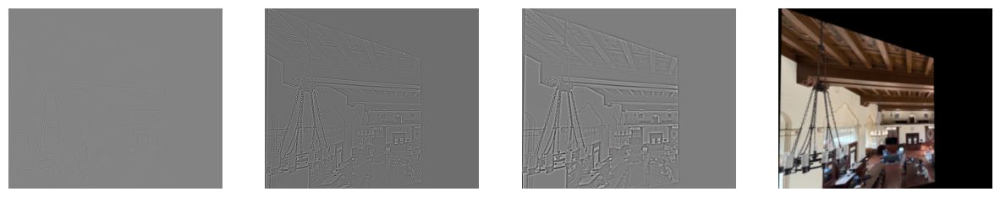

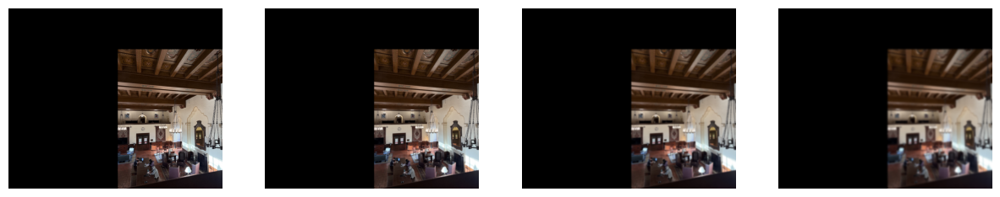

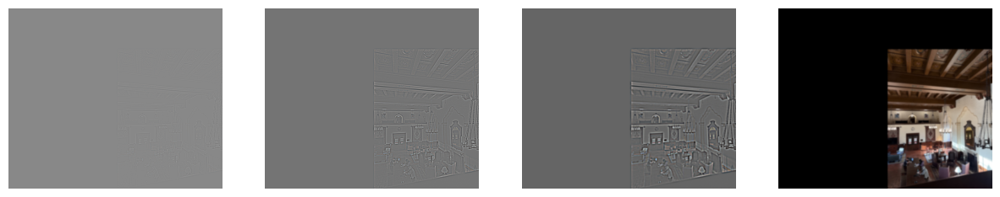

...

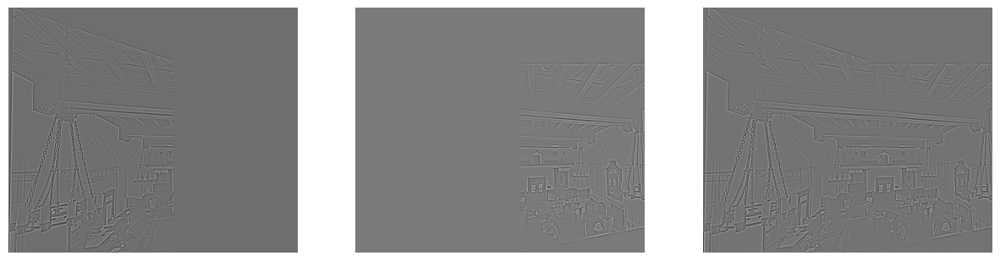

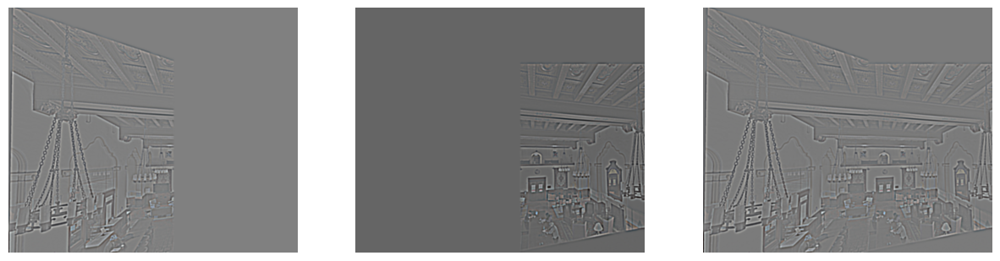

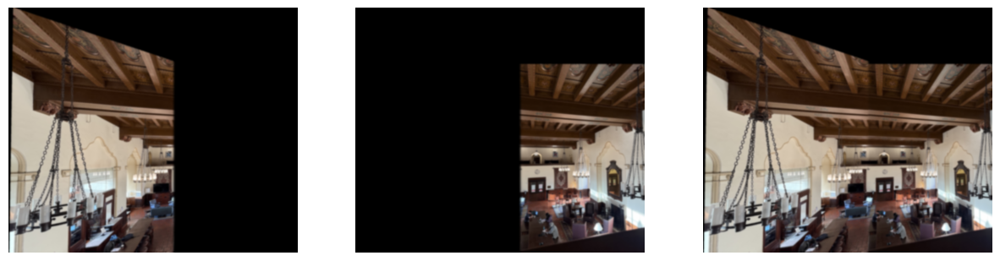

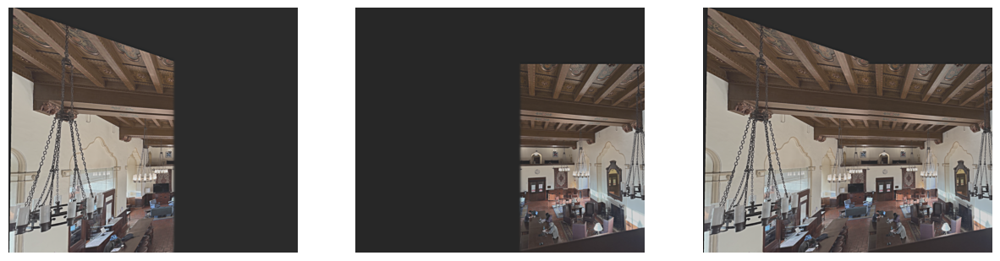

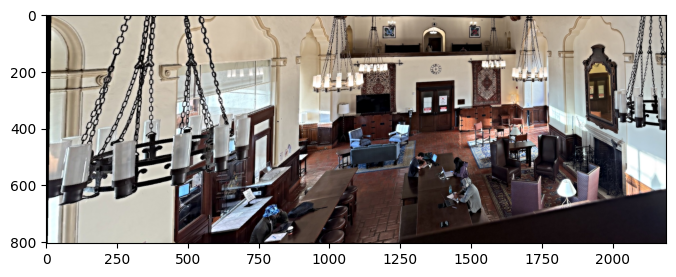

In [14]:

def go_mosaic(warped_hall1, warped_hall2, half_mask):
    times = 4 # inital was 6

    def convolve_channels(image, kernel):
        new_image = np.zeros_like(image)
        for i in range(image.shape[2]):
            new_image[:,:,i] = scipy.signal.convolve2d(image[:,:,i], kernel, mode='same', boundary='symm')
            # We could use this instead of scipy.signal.convolve2d, as it is faster, but its behaves a little differently:
            # new_image[:,:,i] = cv2.filter2D(image[:,:,i], ddepth=-1, kernel=kernel)
        return new_image
    def get_stacked_gau(img):
        stack_gau = []
        stack_gau.append(img)
        for i in range(times - 1):
            # To archive the same amount of blurring effect, we multiply sigma by 2 for each additional iteration
            sigma = (i + 1) * 2
            # I like to have a small peak in my gaussian, so I added 1, else its kind of a flat "peak"
            kernelsize = sigma * 6 + 1
            gaussian_kernel = cv2.getGaussianKernel(kernelsize,sigma).T * cv2.getGaussianKernel(kernelsize,sigma)
            blurry_image = convolve_channels(stack_gau[i], gaussian_kernel)
            stack_gau.append(blurry_image)
        return stack_gau

    def get_stacked_lap(stacked_gau):
        stack_lap = []
        for i in range(times - 1):
            # Getting the high frequency part by subtracting the blurred image from the original image
            stack_lap.append(stacked_gau[i] - stacked_gau[i + 1])
        stack_lap.append(stacked_gau[i])
        return stack_lap

    def show_images(image_stack):
        fig, axs = plt.subplots(1, len(image_stack), figsize=(15, 5)) 
        for i in range(len(image_stack)):
            axs[i].imshow(normalized_image(image_stack[i])) 
            axs[i].axis('off') 
        plt.show()

    round_half_mask_stack_gau = []
    round_half_mask_stack_gau.append(half_mask)

    # We are doing 6 layers for our stack, so we need to do 5 more
    for i in range(times-1):
        # To archive the same amount of blurring effect, we multiply sigma by 2 for each additional iteration
        sigma = (i + 1) * 2
        # I like to have a small peak in my gaussian, so I added 1, else its kind of a flat "peak"
        kernelsize = sigma * 6 + 1
        gaussian_kernel = cv2.getGaussianKernel(kernelsize,sigma).T * cv2.getGaussianKernel(kernelsize,sigma)
        # We need to choose symm for boundary here because else we get like a weird black border around the white part
        blurry_image_half_mask = scipy.signal.convolve2d(round_half_mask_stack_gau[i], gaussian_kernel, mode='same', boundary='symm')
        round_half_mask_stack_gau.append(blurry_image_half_mask)

    # Show the images
    fig, axs = plt.subplots(1, 6, figsize=(15, 5)) 
    for i in range(times):
        axs[i].imshow(round_half_mask_stack_gau[i], cmap='gray') 
        axs[i].axis('off') 
        # A lazy hack so that I can just multiply the mask with the image later
        round_half_mask_stack_gau[i] = np.stack([round_half_mask_stack_gau[i]] * 3, axis=-1)
    plt.show()

    # Lets do it with with a lot of detail using the laplacian stack
    oranapple = warped_hall1[:,:,:-1]
    oranapple_stack_gau = get_stacked_gau(oranapple)

    show_images(oranapple_stack_gau)

    # Lets do the Laplacian Stack now
    oranapple_stack_lap = get_stacked_lap(oranapple_stack_gau)

    show_images(oranapple_stack_lap)

    watermelon = warped_hall2[:,:,:-1]
    watermelon_stack_gau = get_stacked_gau(watermelon)

    show_images(watermelon_stack_gau)

    # Lets do the Lapclacian Stack now
    watermelon_stack_lap = get_stacked_lap(watermelon_stack_gau)

    show_images(watermelon_stack_lap)

    left_arr = []
    right_arr = []
    final_arr = []
    for i in range(times):
        temp = []
        left = oranapple_stack_lap[i] * round_half_mask_stack_gau[i]
        right = watermelon_stack_lap[i] * (1 - round_half_mask_stack_gau[i])
        temp_final = left + right
        left_arr.append(left)
        right_arr.append(right)
        final_arr.append(temp_final)
        fig, axs = plt.subplots(1, 3, figsize=(15, 5))
        axs[0].imshow(normalized_image(left))
        axs[1].imshow(normalized_image(right))
        axs[2].imshow(normalized_image(temp_final))
        axs[0].axis('off')
        axs[1].axis('off')
        axs[2].axis('off')
        plt.show()

    final_left = 0
    final_right = 0
    final = 0

    for i in range(times):
        final_left += left_arr[i]
        final_right += right_arr[i]
        final += final_arr[i]

    fig, axs = plt.subplots(1, 3, figsize=(15, 5))
    axs[0].imshow(normalized_image(final_left))
    axs[1].imshow(normalized_image(final_right))
    axs[2].imshow(normalized_image(final))
    axs[0].axis('off')
    axs[1].axis('off')
    axs[2].axis('off')

    plt.show()
    return final



# Create Mask
half_mask = np.zeros(warped_hall1.shape[:-1], dtype=np.uint8)

# We want half of the matrix to be white
half_cols = warped_hall1.shape[1] // 2
half_mask[:, :1250] = 1

# The bar on top is like waay to close to the camera which makes the result seem confusing which is why i cut it
new = go_mosaic(warped_hall1, warped_hall2, half_mask)[1050:]
data_clipped = np.clip(new, 0, 1)
plt.imshow(data_clipped)
plt.show()
plt.imsave('output/mosaic1_final.jpg', data_clipped)




Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..2.0].


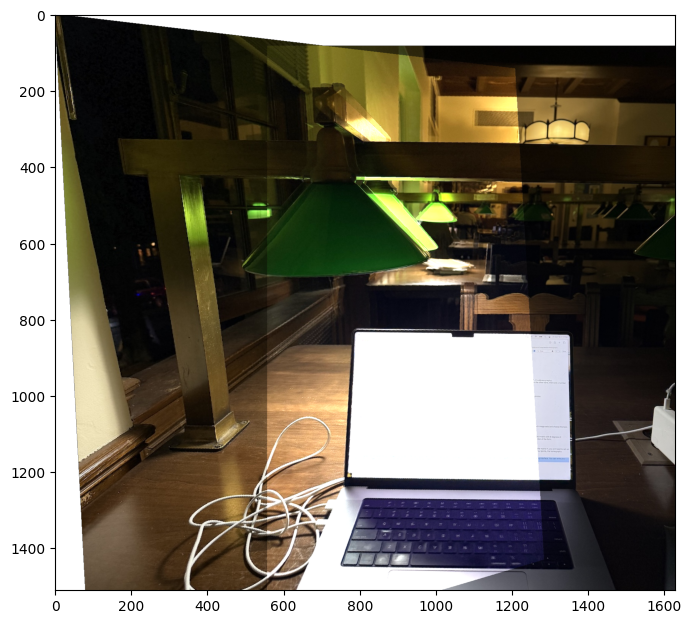

In [15]:
points_hw1, points_hw2 = getpoints("data/hwpoints2.json")
hw1 = plt.imread('data/hw1.jpeg')
hw2 = plt.imread('data/hw2.jpeg')
homography = computeH(points_hw1, points_hw2)
warped_hw1, warped_hw2 = get_warped_image(hw1, hw2, homography)
plt.imshow(warped_hw1 + warped_hw2)


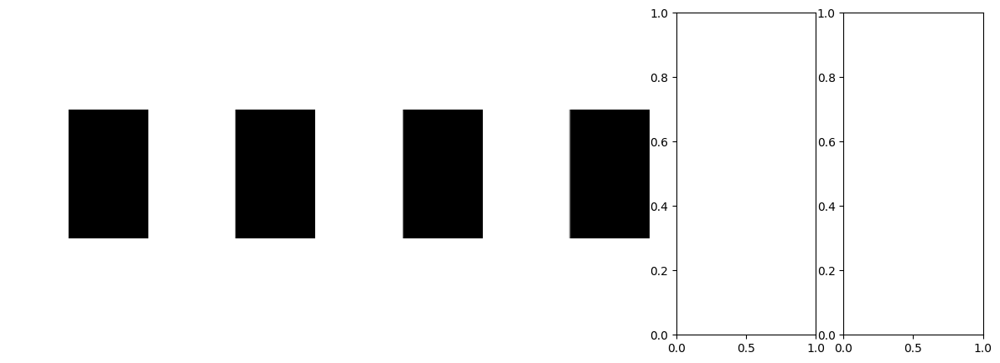

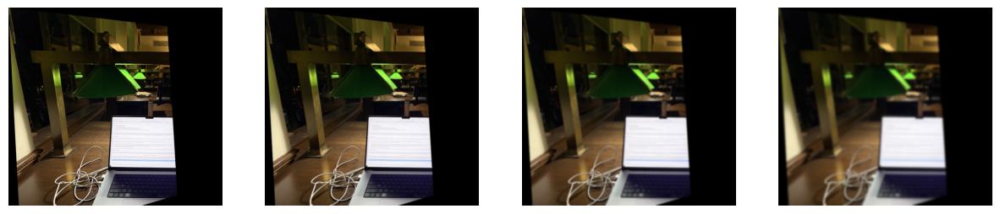

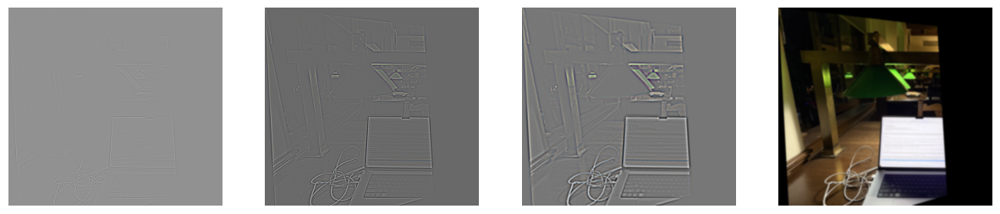

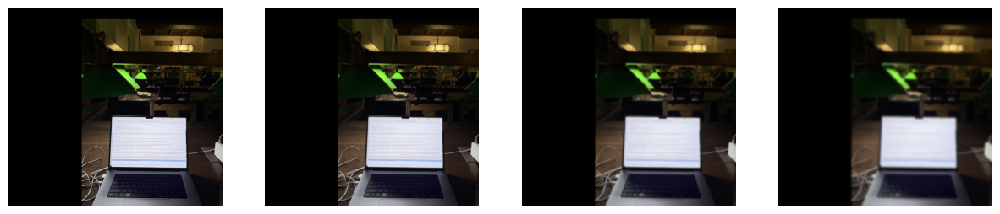

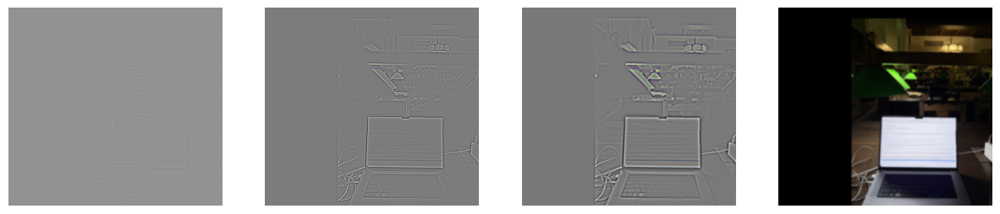

...

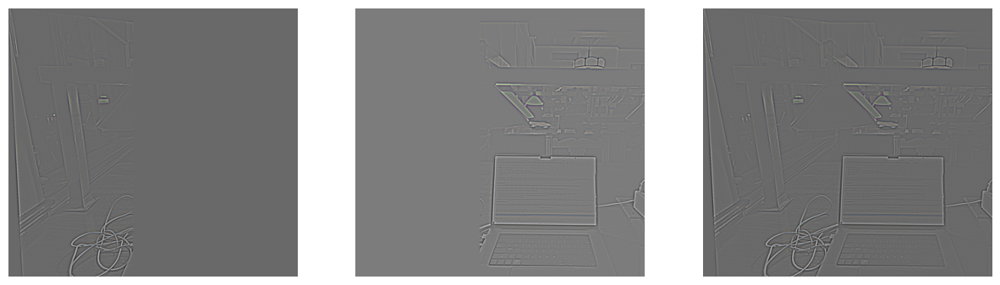

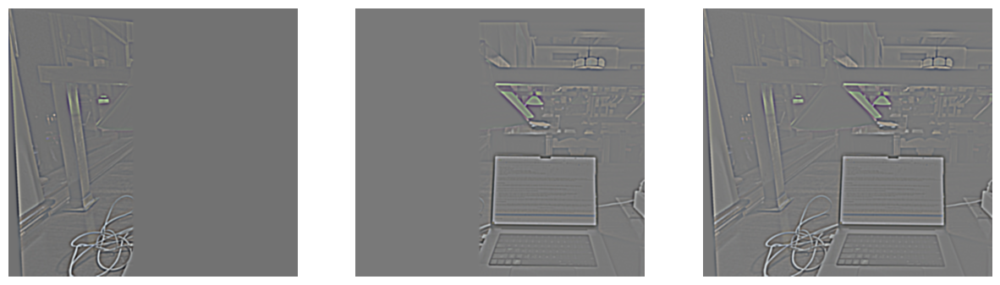

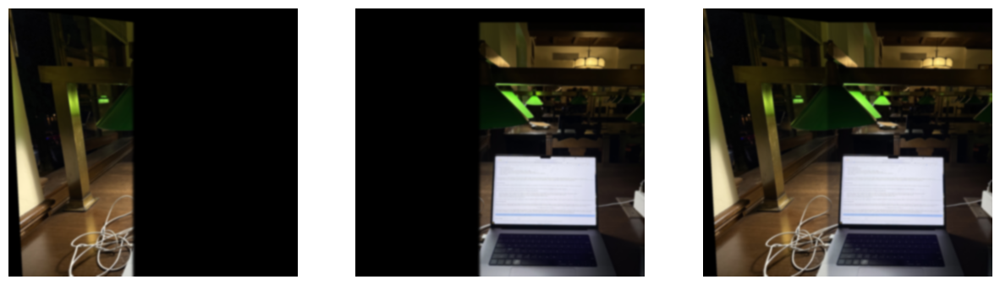

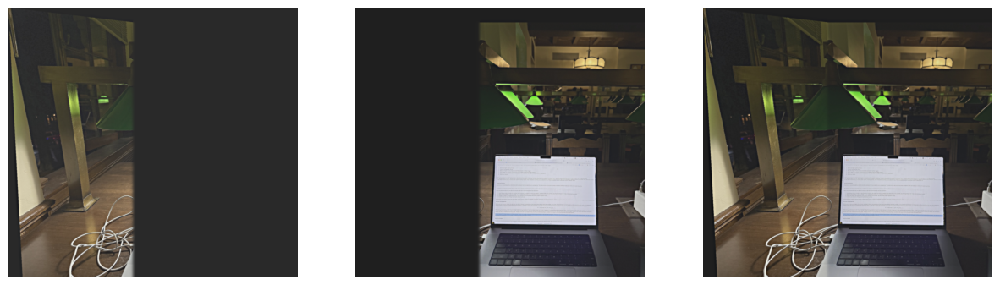

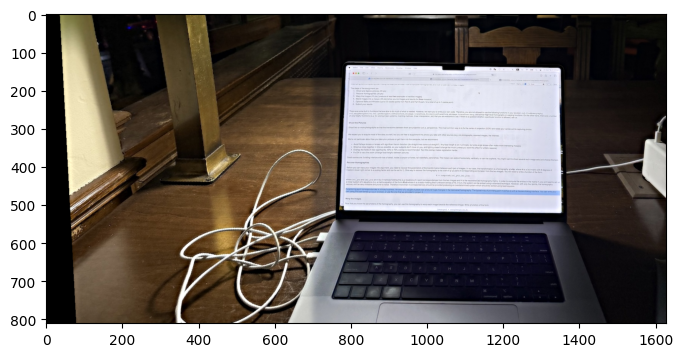

In [16]:
# Create Mask
half_mask = np.zeros(warped_hw1.shape[:-1], dtype=np.uint8)

# We want half of the matrix to be white
half_mask[:, :700] = 1

# The bar on top is like waay to close to the camera which makes the result seem confusing which is why i cut it
new = go_mosaic(warped_hw1, warped_hw2, half_mask)[700:]
data_clipped = np.clip(new, 0, 1)
plt.imshow(data_clipped)
plt.show()
plt.imsave('output/mosaic2_final.jpg', data_clipped)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..2.0].


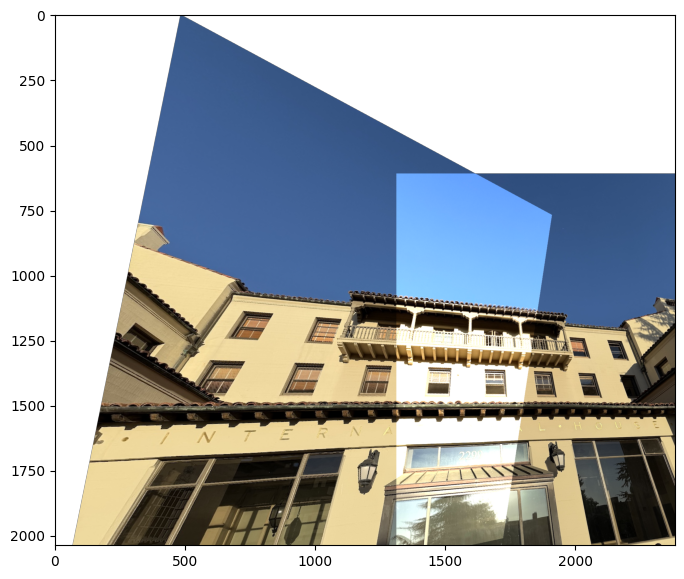

In [17]:
points_ihouse1, points_ihouse2 = getpoints("data/house.json")
ihouse1 = plt.imread('data/ihouse1.jpeg')
ihouse2 = plt.imread('data/ihouse2.jpeg')
homography = computeH(points_ihouse1, points_ihouse2)
warped_ihouse1, warped_ihouse2 = get_warped_image(ihouse1, ihouse2, homography)
plt.imshow(warped_ihouse1 + warped_ihouse2)

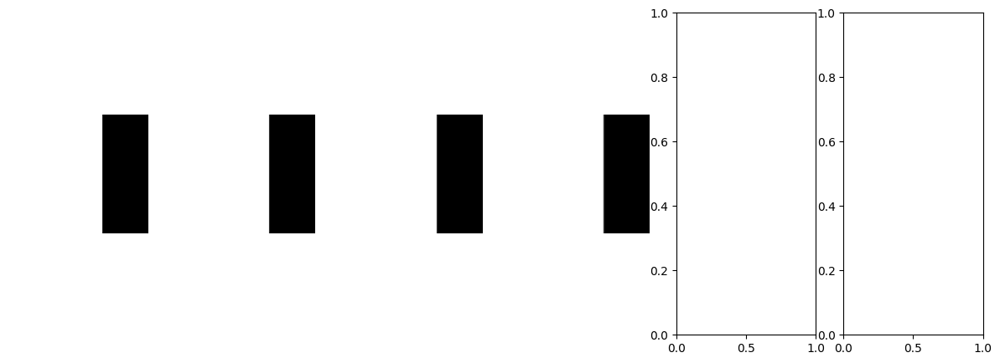

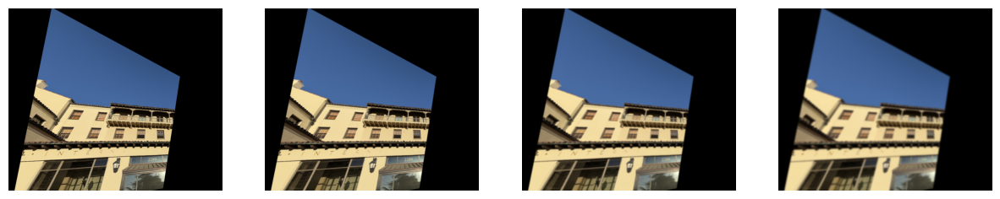

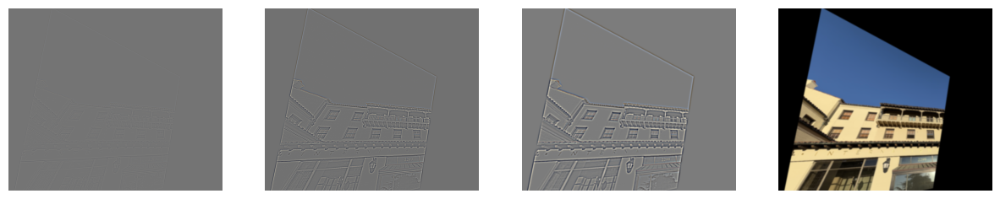

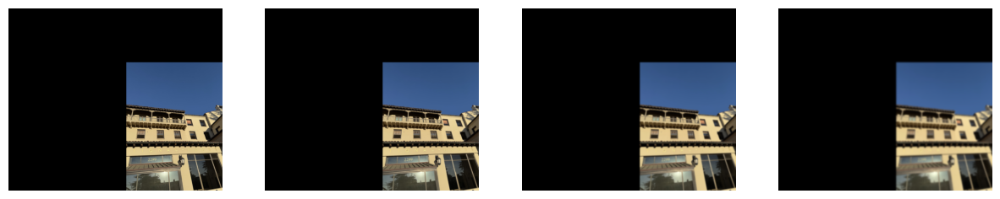

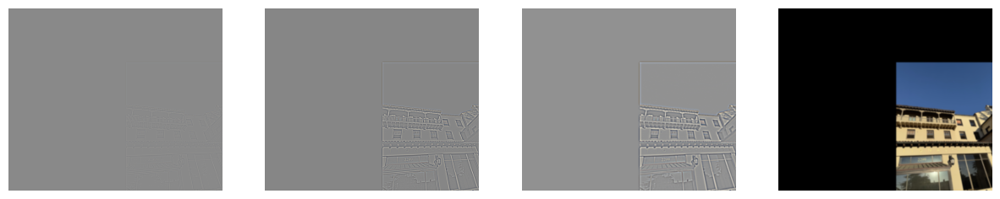

...

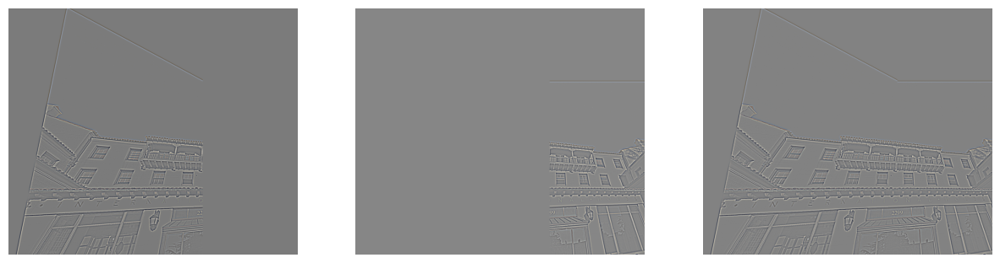

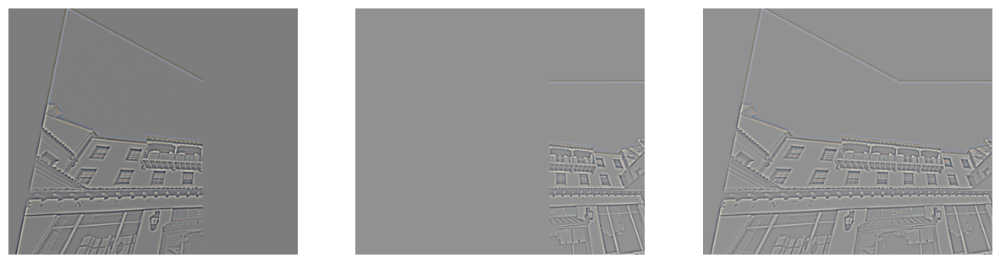

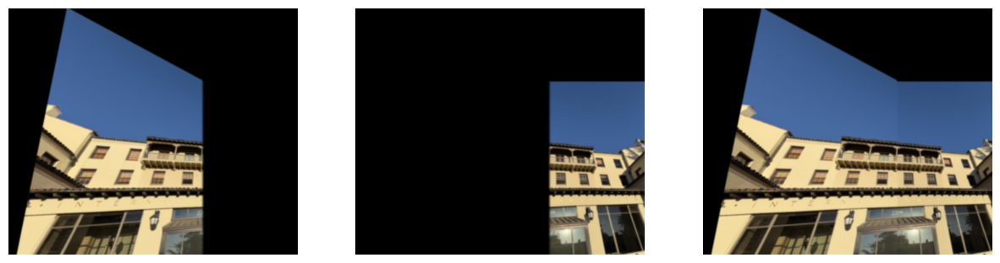

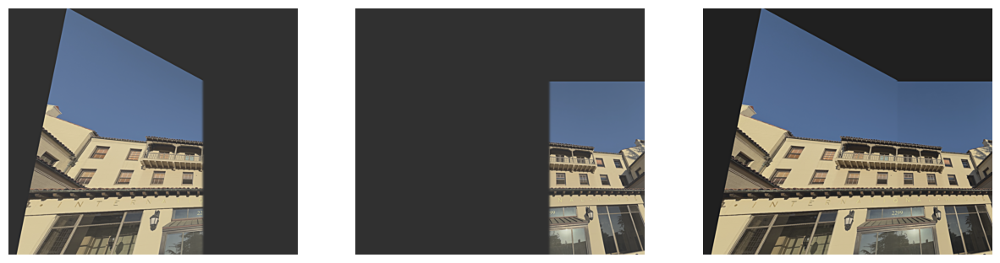

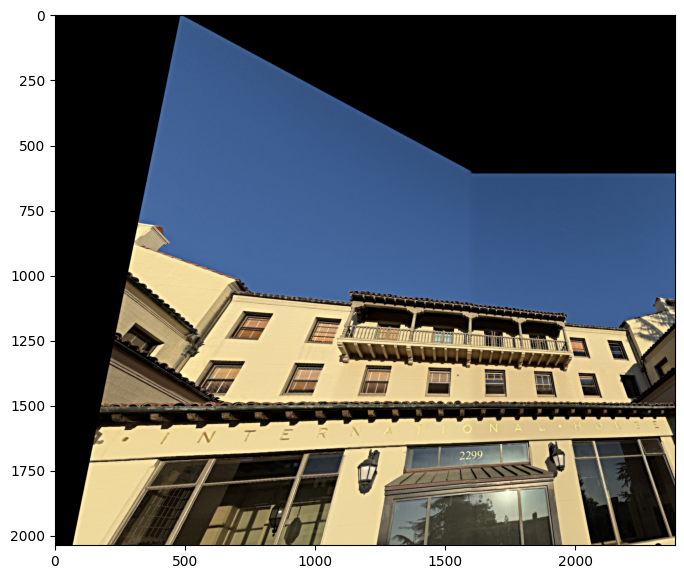

In [18]:
# Create Mask
half_mask = np.zeros(warped_ihouse1.shape[:-1], dtype=np.uint8)

# We want half of the matrix to be white
half_mask[:, :1600] = 1

# The bar on top is like waay to close to the camera which makes the result seem confusing which is why i cut it
new = go_mosaic(warped_ihouse1, warped_ihouse2, half_mask)
ihousefinal = np.clip(new, 0, 1)
plt.imshow(ihousefinal)
plt.show()

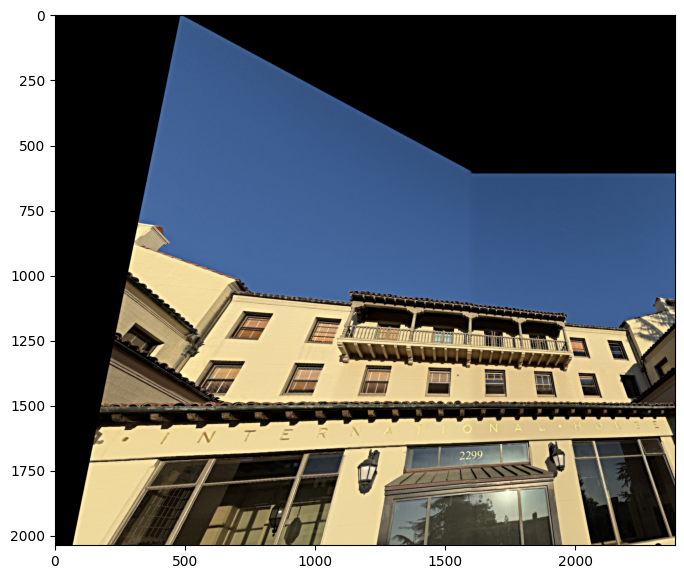

In [19]:
plt.imshow(ihousefinal)
plt.imsave('output/mosaic3_l.jpg', warped_ihouse1)
plt.imsave('output/mosaic3_r.jpg', warped_ihouse2)
plt.imsave('output/mosaic3_final.jpg', ihousefinal)